# **Data cleaning**

*clean data: remove all trajectory points > 225*

*translate data: convert robot flange `X Y Z A B C` to brushtip `X' Y' Z' A B C`*

## **Params**

In [28]:
from pathlib import Path

import numpy as np
import pandas as pd
import math

import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'monospace'

In [29]:
import warnings
warnings.filterwarnings("ignore", message=".*swapaxes.*")

In [30]:
# matplotlib params

plt.rcParams['figure.dpi'] = 300        # display DPI
plt.rcParams['savefig.dpi'] = 300       # export (saved figure) DPI

plt.rcParams['grid.color'] = [0.8, 0.8, 1.0, 0.5]
plt.rcParams['axes.edgecolor'] = [0.2, 0.2, 0.5, 0]


## **1. Read Data**

In [31]:
# Discover motion CSVs and measure sequence length statistics
data_dir = Path("data")
seq_columns = [f"A{i}" for i in range(1, 8)]

# Enumerate trajectory files and ensure the folder is populated
csv_files = sorted(data_dir.glob("*.csv"))
if not csv_files:
    raise FileNotFoundError(f"No CSV files found under {data_dir.resolve()}")

# Track min/mean/max sequence lengths for padding decisions
lengths = [len(pd.read_csv(fp)) for fp in csv_files]
max_seq_len = max(lengths)
min_seq_len = min(lengths)
mean_seq_len = float(np.mean(lengths))

print(f"Found {len(csv_files)} motion files")
print(f"Sequence length stats -> min: {min_seq_len}, max: {max_seq_len}, mean: {mean_seq_len:.1f} timesteps")


Found 300 motion files
Sequence length stats -> min: 55, max: 758, mean: 174.9 timesteps


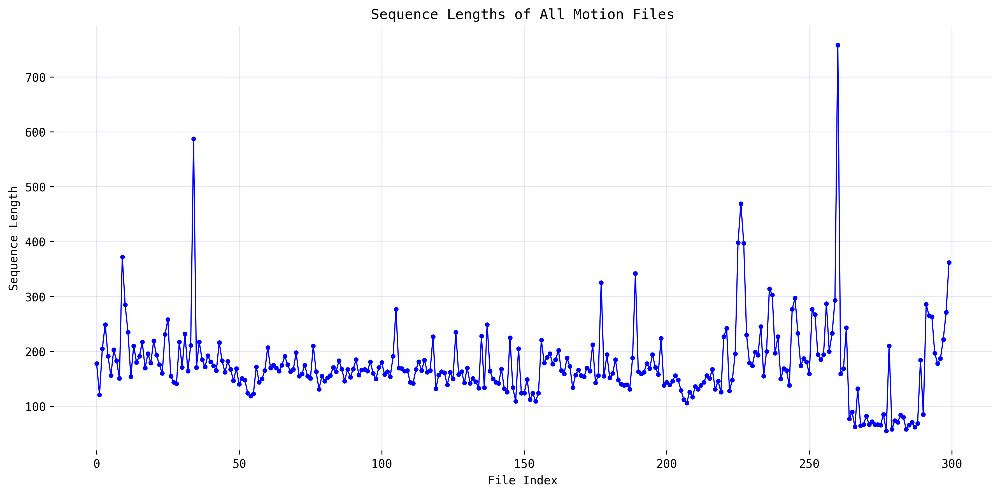

In [32]:
plt.figure(figsize=(12, 6))
plt.plot(lengths, marker='o', lw = 1, color='b', markersize=3)
plt.xlabel("File Index")
plt.ylabel("Sequence Length")
plt.title("Sequence Lengths of All Motion Files")
plt.grid(True, color='b', alpha=0.1)
plt.tight_layout()

# Hide the top and right spines (the extra black border lines)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.show()

In [33]:
def traj_plot(csv_files, n, z_cutoff):

    # --- Compute global axis limits ---
    x_min = y_min = z_min = np.inf
    x_max = y_max = z_max = -np.inf

    for fp in csv_files[:n]:
        df = pd.read_csv(fp)
        x_min = min(x_min, df['X_mm'].min()); x_max = max(x_max, df['X_mm'].max())
        y_min = min(y_min, df['Y_mm'].min()); y_max = max(y_max, df['Y_mm'].max())
        z_min = min(z_min, df['Z_mm'].min()); z_max = max(z_max, df['Z_mm'].max())
    
    print(f"minimum z is {z_min}, maximum z is {z_max}")

    fig = plt.figure(figsize=(36, 12), constrained_layout=True)
    for i, fp in enumerate(csv_files[:n]):
        df = pd.read_csv(fp)
        ax = fig.add_subplot(2, 5, i + 1, projection='3d')

        # --- Build mask and split into continuous runs where mask is constant ---
        mask = (df['Z_mm'] <= z_cutoff).to_numpy()
        change_idx = np.where(mask[1:] != mask[:-1])[0] + 1  # indices where True/False flips
        segs = np.split(df, change_idx)
        mask_segs = np.split(mask, change_idx)

        # --- Plot each continuous segment with the appropriate color ---
        for seg, mseg in zip(segs, mask_segs):
            if seg.empty:
                continue
            color = 'b' if mseg[0] else '0.7'  # blue for Z<=cutoff, grey for Z>cutoff
            ax.plot(seg['X_mm'], seg['Y_mm'], seg['Z_mm'], color=color, lw=2)

        ax.set_title(fp.name)
        ax.set_xlabel('X (mm)', fontsize=9, labelpad=6)
        ax.set_ylabel('Y (mm)', fontsize=9, labelpad=6)
        ax.set_zlabel('Z (mm)', fontsize=9, labelpad=6)
        ax.tick_params(labelsize=8)
        ax.grid(True)

        # Remove 3D background panes
        for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
            axis.pane.fill = False

        # Consistent global limits
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_zlim(z_min, z_max)

    plt.show()


minimum z is 198.045, maximum z is 347.497


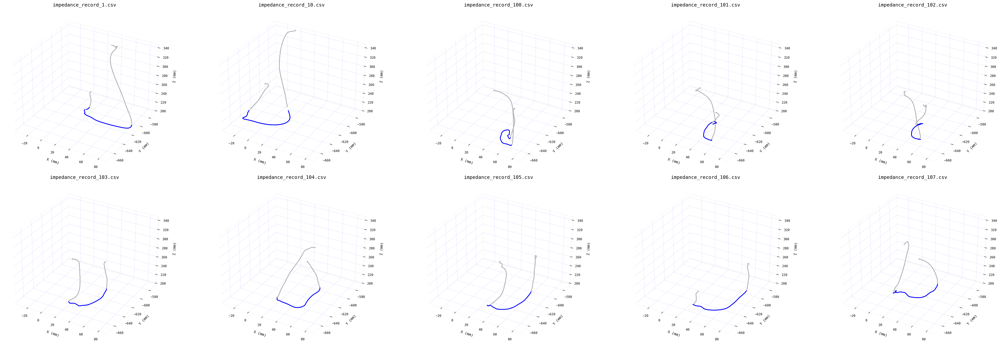

In [34]:
traj_plot(csv_files, 10, 225)

## **2. Clean Data**

*Remove all trajectory points with Z > 225*

*If trajectory gets split into 2, get the longer one*

In [35]:
clean_dir = data_dir / "cleaned_z240"
clean_dir.mkdir(parents=True, exist_ok=True)

cleaned_files = []

for fp in csv_files:
    df = pd.read_csv(fp)
    mask = df["Z_mm"] <= 225
    if not mask.any():
        print(f"Skipping {fp.name}: no rows with Z <= 225")
        continue

    group_id = (mask != mask.shift(fill_value=False)).cumsum()
    best_segment = None
    best_length = 0
    best_gid = None

    for gid, segment in df[mask].groupby(group_id[mask]):
        length = len(segment)
        if length > best_length:
            best_length = length
            best_segment = segment.copy()
            best_gid = gid

    cleaned_df = best_segment.reset_index(drop=True)
    clean_fp = clean_dir / fp.name
    cleaned_df.to_csv(clean_fp, index=False)
    cleaned_files.append(clean_fp)
    print(f"{fp.name}: kept {best_length} of {len(df)} rows (segment {best_gid})")

if not cleaned_files:
    raise ValueError("No cleaned CSVs were produced; adjust the Z threshold.")

cleaned_lengths = [len(pd.read_csv(fp)) for fp in cleaned_files]
max_seq_len = max(cleaned_lengths)
min_seq_len = min(cleaned_lengths)
mean_seq_len = float(np.mean(cleaned_lengths))

print(f"Cleaned files saved to {clean_dir.resolve()}")
print("Cleaned sequence length stats -> min: {min_seq_len}, max: {max_seq_len}, mean: {mean_seq_len:.1f} timesteps".format(min_seq_len=min_seq_len, max_seq_len=max_seq_len, mean_seq_len=mean_seq_len))


impedance_record_1.csv: kept 55 of 178 rows (segment 3)
impedance_record_10.csv: kept 43 of 121 rows (segment 1)
impedance_record_100.csv: kept 104 of 205 rows (segment 1)
impedance_record_101.csv: kept 89 of 249 rows (segment 1)
impedance_record_102.csv: kept 84 of 191 rows (segment 1)
impedance_record_103.csv: kept 71 of 156 rows (segment 1)
impedance_record_104.csv: kept 87 of 203 rows (segment 1)
impedance_record_105.csv: kept 83 of 183 rows (segment 3)
impedance_record_106.csv: kept 80 of 151 rows (segment 1)
impedance_record_107.csv: kept 177 of 372 rows (segment 3)
impedance_record_108.csv: kept 109 of 285 rows (segment 1)
impedance_record_109.csv: kept 97 of 235 rows (segment 1)
impedance_record_11.csv: kept 47 of 154 rows (segment 1)
impedance_record_110.csv: kept 72 of 210 rows (segment 1)
impedance_record_111.csv: kept 72 of 180 rows (segment 1)
impedance_record_112.csv: kept 83 of 191 rows (segment 1)
impedance_record_113.csv: kept 98 of 217 rows (segment 1)
impedance_recor

minimum z is 198.045, maximum z is 225.0


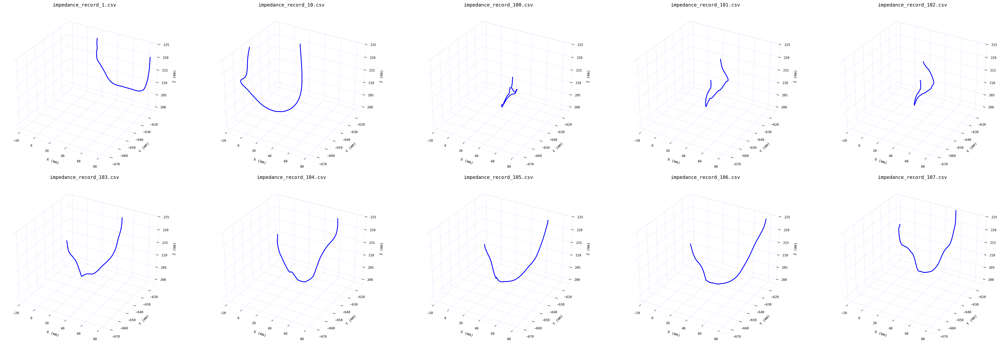

In [36]:
traj_plot(cleaned_files, 10, 225)

## **3. Translate Data**

*Robot Flange XYZABC to Brush TCP XYZABC*

In [37]:
# retrieve the cleaned csvs
data_dir = Path("data/cleaned_z240")
seq_columns = [f"A{i}" for i in range(1, 8)]

# Enumerate trajectory files and ensure the folder is populated
csv_files = sorted(data_dir.glob("*.csv"))
if not csv_files:
    raise FileNotFoundError(f"No CSV files found under {data_dir.resolve()}")

# Track min/mean/max sequence lengths for padding decisions
lengths = [len(pd.read_csv(fp)) for fp in csv_files]
max_seq_len = max(lengths)
min_seq_len = min(lengths)
mean_seq_len = float(np.mean(lengths))

print(f"Found {len(csv_files)} motion files")
print(f"Sequence length stats -> min: {min_seq_len}, max: {max_seq_len}, mean: {mean_seq_len:.1f} timesteps")


Found 300 motion files
Sequence length stats -> min: 19, max: 233, mean: 81.0 timesteps


In [38]:
# old model was rotating in XYZ order, but KUKA does ZYX order
def brush_xyz(X, Y, Z, alpha, beta, gamma, n=240.0):
    """
    Compute brush XYZ from a commanded pose (X,Y,Z, alpha,beta,gamma),
    where alpha=rot about Z, beta=rot about Y, gamma=rot about X (KUKA ABC, Z-Y-X).
    n is the offset of Tool 2 along the flange +Z (mm).
    Angles in radians; distances in mm.
    """
    ca, sa = math.cos(alpha), math.sin(alpha)  # alpha -> about Z
    cb, sb = math.cos(beta),  math.sin(beta)   # beta  -> about Y
    cc, sc = math.cos(gamma), math.sin(gamma)  # gamma -> about X

    # R = Rz(alpha) @ Ry(beta) @ Rx(gamma)
    # Third column of R (local +Z expressed in world):
    kx = ca*sb*cc + sa*sc
    ky = sa*sb*cc - ca*sc
    kz = cb*cc

    return (X + n*kx, Y + n*ky, Z + n*kz)

In [39]:
# Replace world coordinate columns with brush tip positions
required_columns = {"X_mm", "Y_mm", "Z_mm", "alpha_rad", "beta_rad", "gamma_rad"}

for csv_path in csv_files:
    df = pd.read_csv(csv_path)
    missing = required_columns.difference(df.columns)
    if missing:
        raise ValueError(f"{csv_path.name} is missing columns: {sorted(missing)}")
    brush_xyz_values = np.array([
        brush_xyz(row.X_mm, row.Y_mm, row.Z_mm, row.alpha_rad, row.beta_rad, row.gamma_rad, n=240.0)
        for row in df.itertuples(index=False)
    ], dtype=float)
    df[["X_mm", "Y_mm", "Z_mm"]] = brush_xyz_values
    df.to_csv(csv_path, index=False)

print(f"Updated {len(csv_files)} CSV files with brush-tip XYZ")


Updated 300 CSV files with brush-tip XYZ


minimum z is -31.302557045877137, maximum z is -4.788296046489506


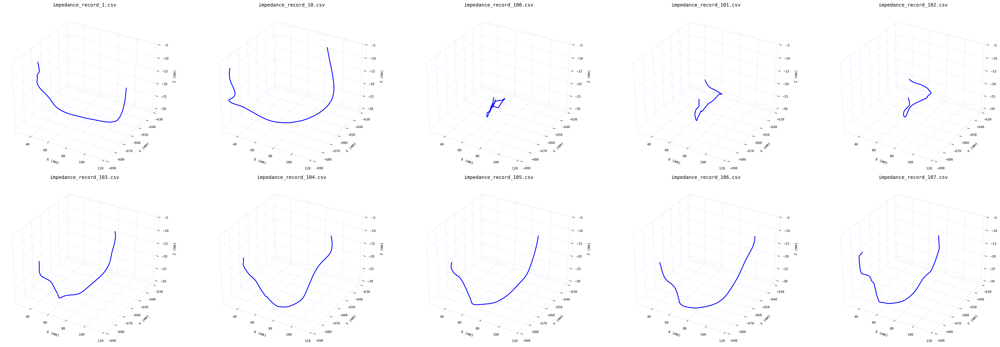

In [40]:
traj_plot(csv_files, 10, 225)